# FETAL HEALTH CLASSIFICATION

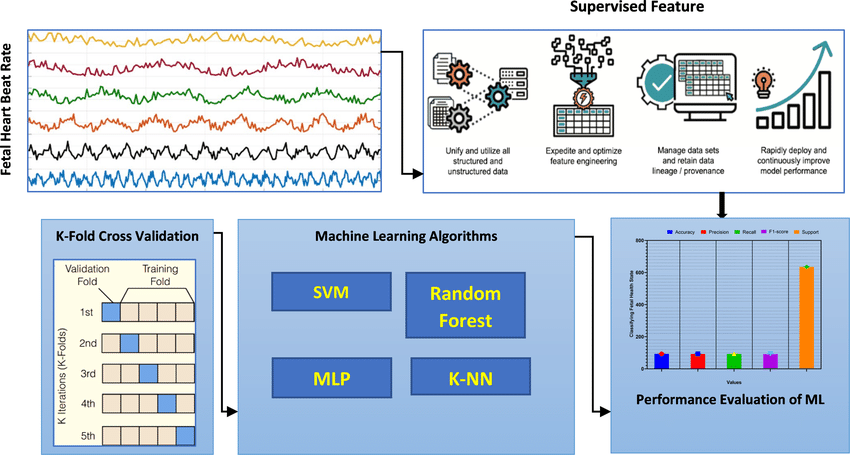

#### 2126 measurements extracted from cardiotocograms and classified by expert obstetricians, as described in the dataset.

### Importing Header Files

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
from sklearn.metrics import roc_curve, auc, accuracy_score, confusion_matrix
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.preprocessing import label_binarize, StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split
from itertools import cycle
from imblearn.over_sampling import RandomOverSampler,SMOTE

### Importing Dataset & Performing Essential Steps

In [2]:
df=pd.read_csv('fetal_health.csv')
df

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.000,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.000,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.000,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.000,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.000,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.0,0.000,0.000,0.007,0.000,0.0,0.0,79.0,0.2,25.0,...,137.0,177.0,4.0,0.0,153.0,150.0,152.0,2.0,0.0,2.0
2122,140.0,0.001,0.000,0.007,0.000,0.0,0.0,78.0,0.4,22.0,...,103.0,169.0,6.0,0.0,152.0,148.0,151.0,3.0,1.0,2.0
2123,140.0,0.001,0.000,0.007,0.000,0.0,0.0,79.0,0.4,20.0,...,103.0,170.0,5.0,0.0,153.0,148.0,152.0,4.0,1.0,2.0
2124,140.0,0.001,0.000,0.006,0.000,0.0,0.0,78.0,0.4,27.0,...,103.0,169.0,6.0,0.0,152.0,147.0,151.0,4.0,1.0,2.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

### Exploratory Data Analysis

In [4]:
df.isnull().mean()*100

baseline value                                            0.0
accelerations                                             0.0
fetal_movement                                            0.0
uterine_contractions                                      0.0
light_decelerations                                       0.0
severe_decelerations                                      0.0
prolongued_decelerations                                  0.0
abnormal_short_term_variability                           0.0
mean_value_of_short_term_variability                      0.0
percentage_of_time_with_abnormal_long_term_variability    0.0
mean_value_of_long_term_variability                       0.0
histogram_width                                           0.0
histogram_min                                             0.0
histogram_max                                             0.0
histogram_number_of_peaks                                 0.0
histogram_number_of_zeroes                                0.0
histogra

In [5]:
df.duplicated().sum()

13

In [6]:
df.drop_duplicates(inplace=True)

In [7]:
df.duplicated().sum()

0

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
baseline value,2113.0,133.304780,9.837451,106.0,126.000,133.000,140.000,160.000
accelerations,2113.0,0.003188,0.003871,0.0,0.000,0.002,0.006,0.019
fetal_movement,2113.0,0.009517,0.046804,0.0,0.000,0.000,0.003,0.481
uterine_contractions,2113.0,0.004387,0.002941,0.0,0.002,0.005,0.007,0.015
light_decelerations,2113.0,0.001901,0.002966,0.0,0.000,0.000,0.003,0.015
severe_decelerations,2113.0,0.000003,0.000057,0.0,0.000,0.000,0.000,0.001
prolongued_decelerations,2113.0,0.000159,0.000592,0.0,0.000,0.000,0.000,0.005
abnormal_short_term_variability,2113.0,46.993848,17.177782,12.0,32.000,49.000,61.000,87.000
mean_value_of_short_term_variability,2113.0,1.335021,0.884368,0.2,0.700,1.200,1.700,7.000
percentage_of_time_with_abnormal_long_term_variability,2113.0,9.795078,18.337073,0.0,0.000,0.000,11.000,91.000


In [9]:
df.shape

(2113, 22)

## Univariate Anaslysis

### Displot

#### This function provides access to several approaches for visualizing the univariate or bivariate distribution of data, including subsets of data defined by semantic mapping and faceting across multiple subplots. 

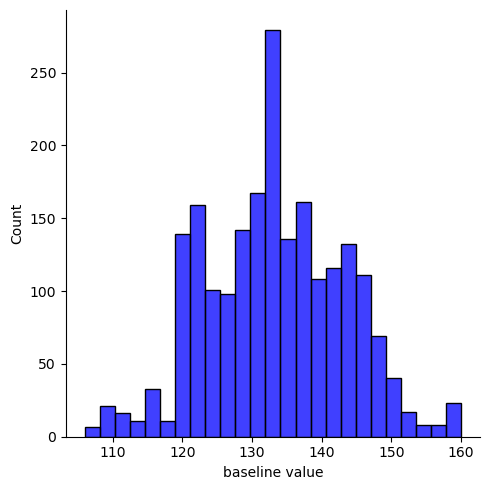

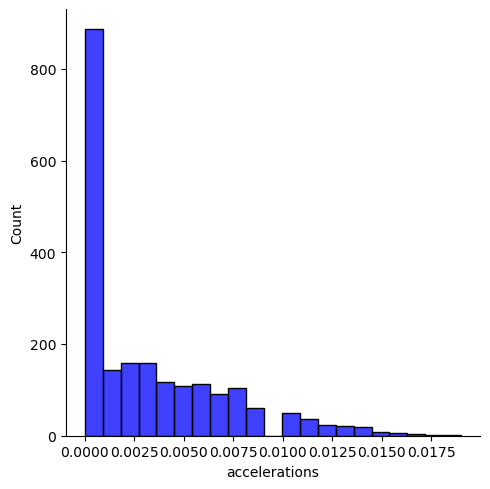

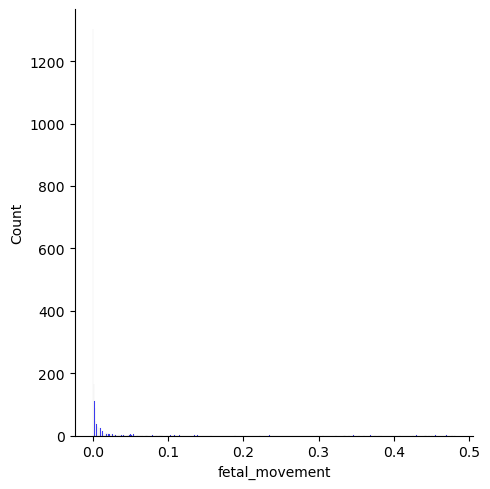

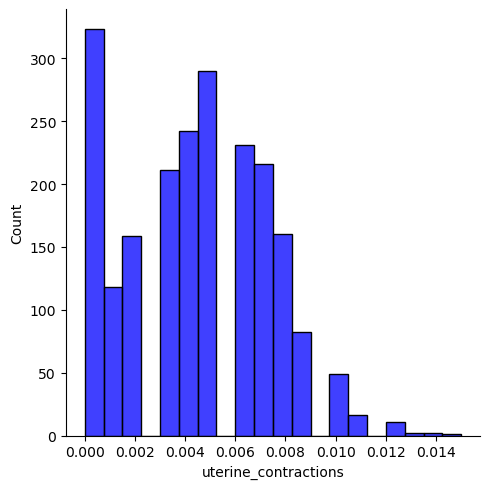

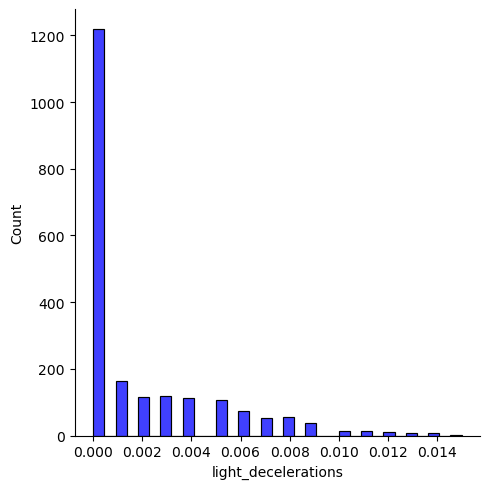

...

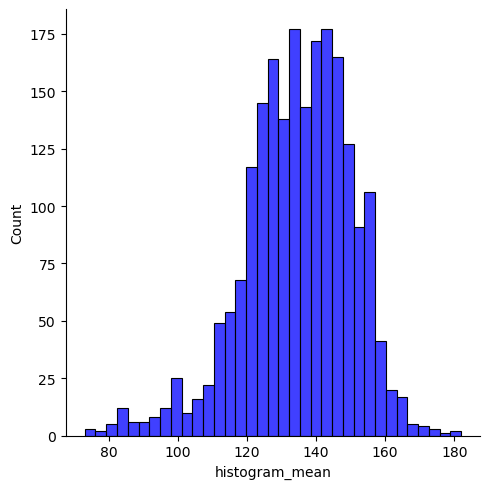

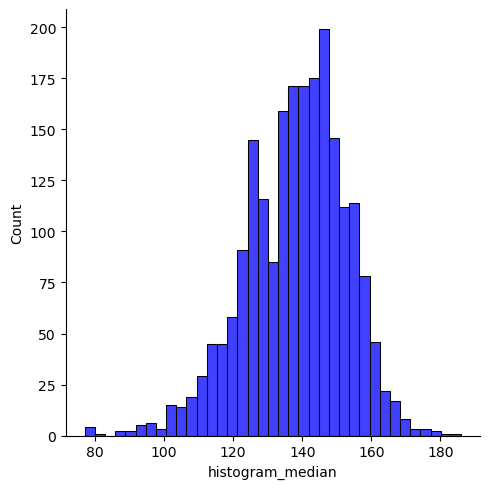

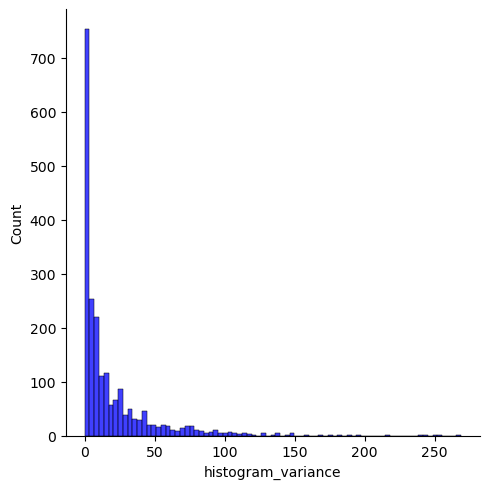

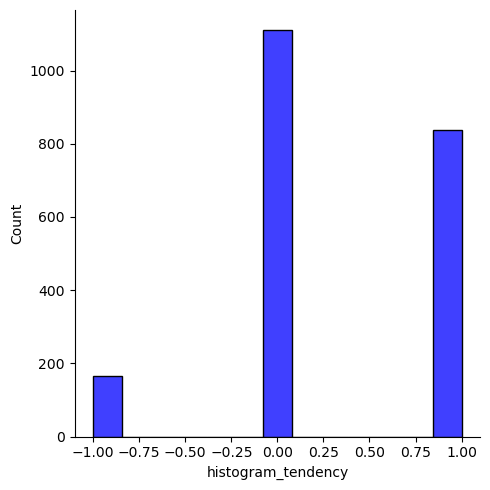

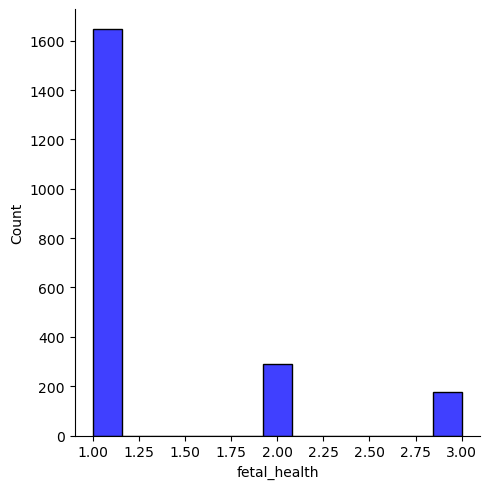

In [11]:
for i in df.columns:
    if df[i].dtypes!='object':
        sns.displot(x=df[i],color='blue')
        plt.show()

#### KDE Plot

#### A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset, analogous to a histogram. KDE represents the data using a continuous probability density curve in one or more dimensions.¶

for i in df.columns:

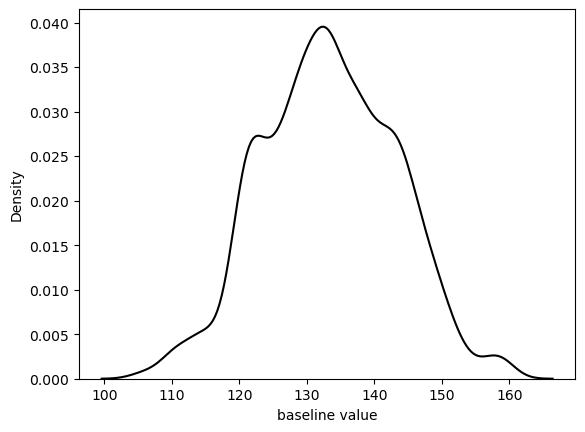

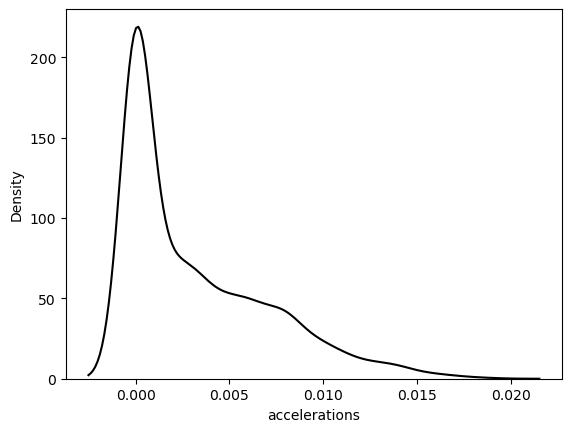

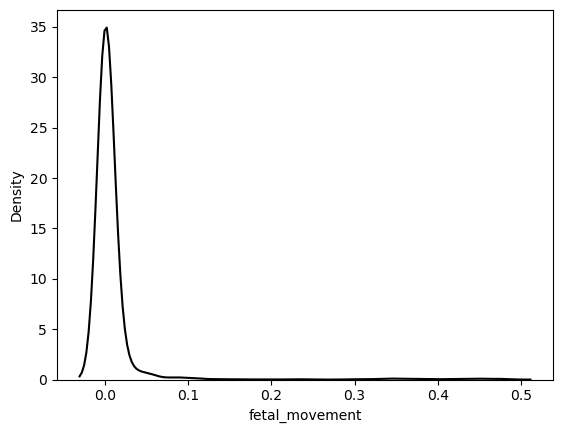

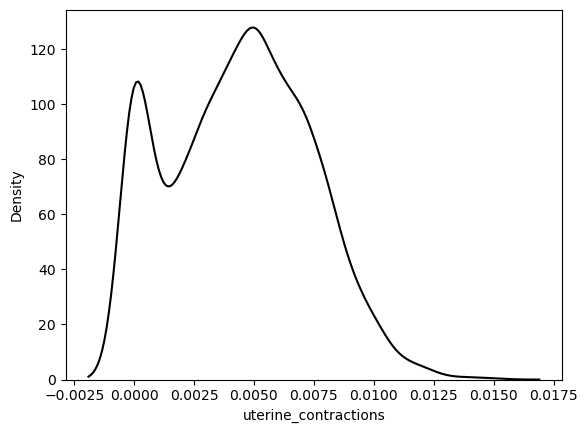

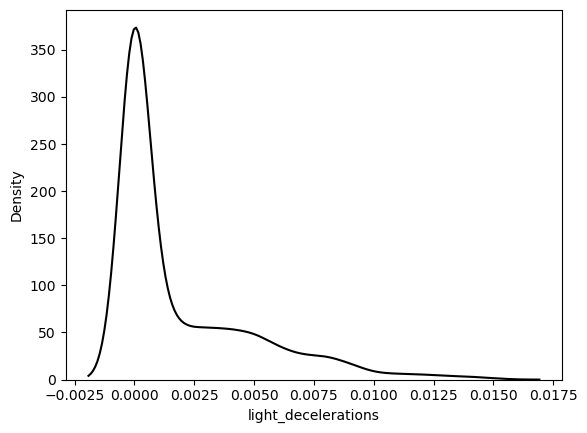

...

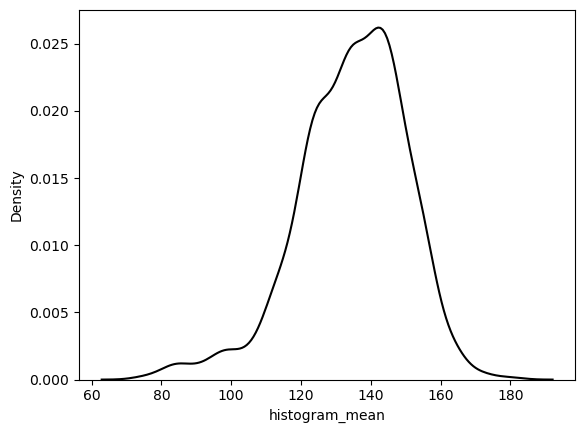

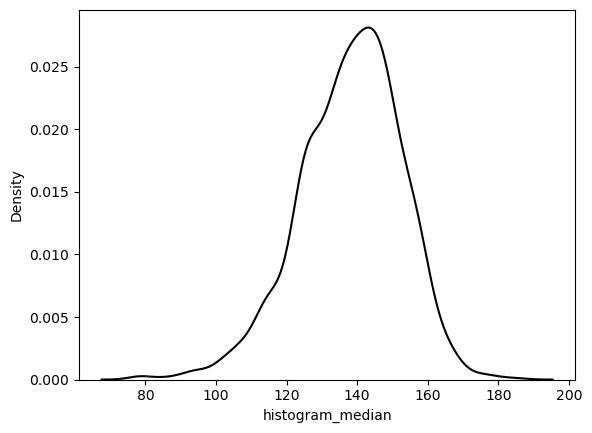

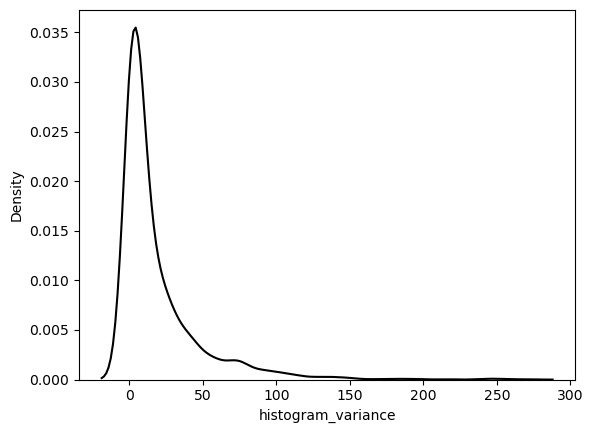

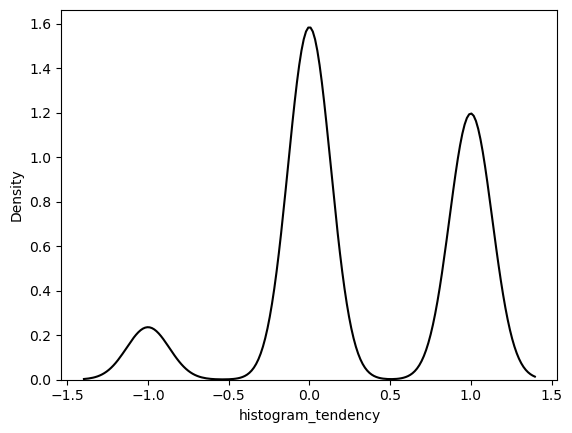

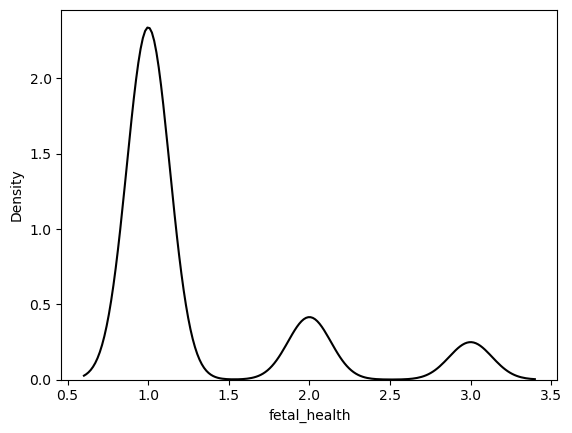

In [13]:
for i in df.columns:
    if df[i].dtypes!='object':
        sns.kdeplot(x=df[i],color='black')
        plt.show()

### Stripplot

#### A strip plot can be drawn on its own, but it is also a good complement to a box or violin plot in cases where you want to show all observations along with some representation of the underlying distribution.

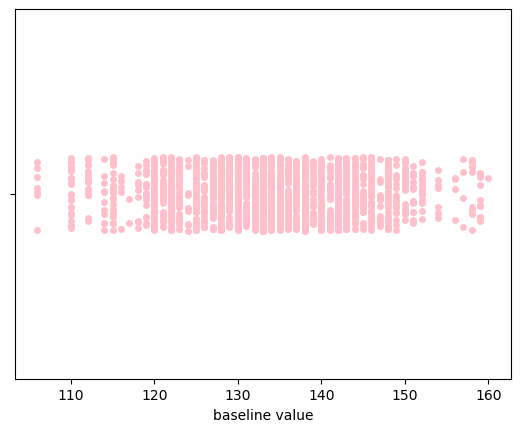

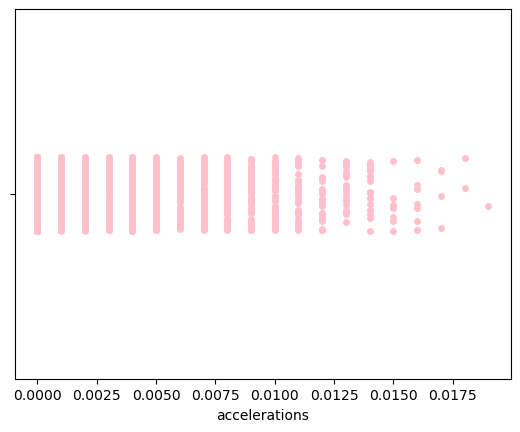

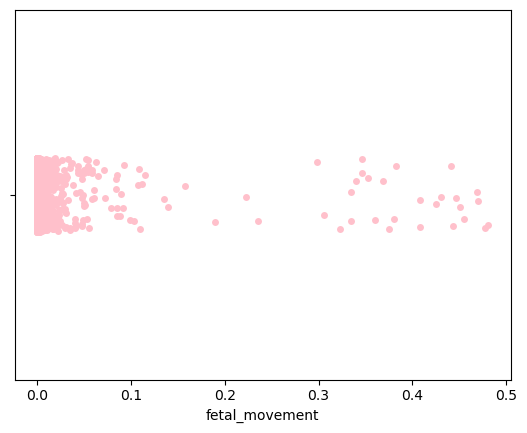

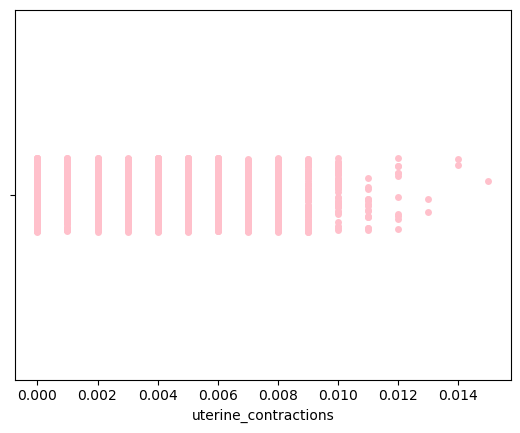

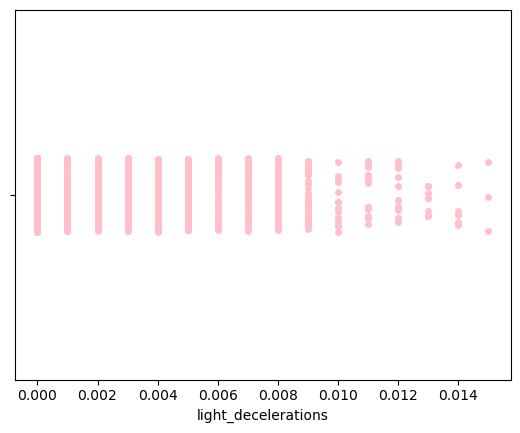

...

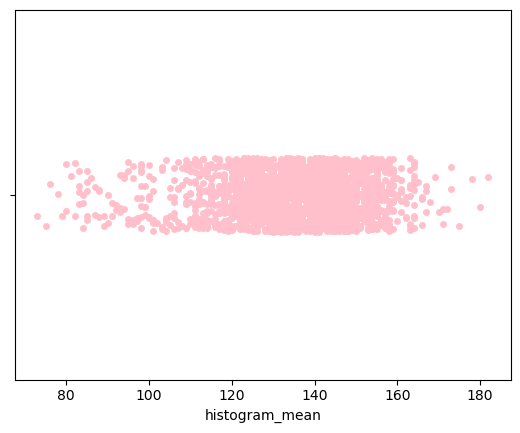

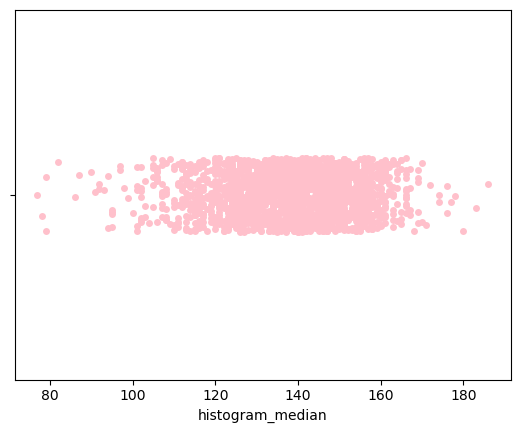

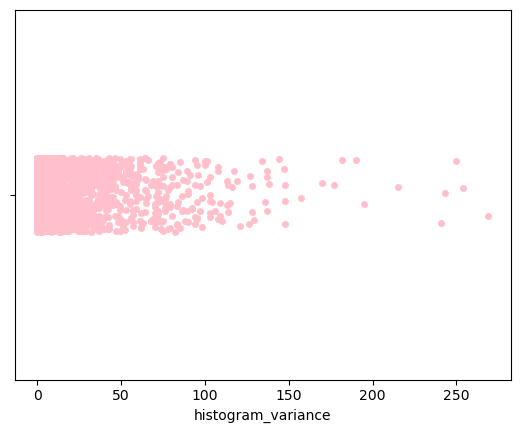

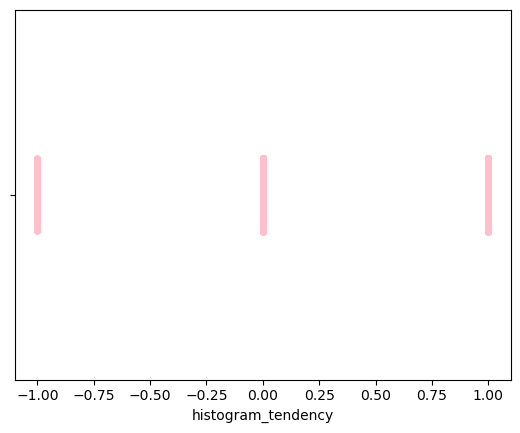

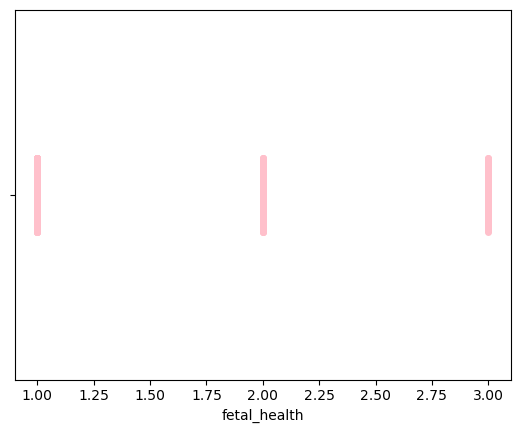

In [15]:
for i in df.columns:
    if df[i].dtypes!='object':
        sns.stripplot(x=df[i],color='pink')
        plt.show()

### Violinplot

#### This function is intended to complement other plots by showing the location of individual observations in an unobtrusive way.¶

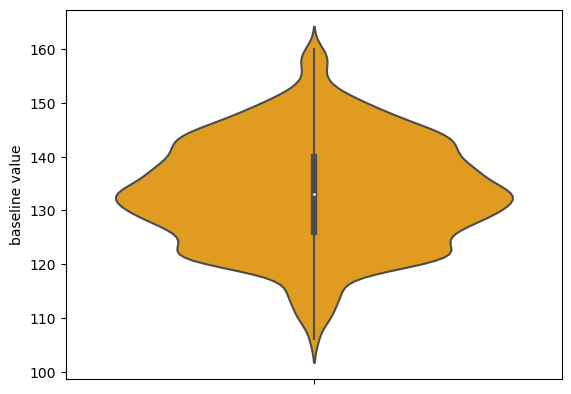

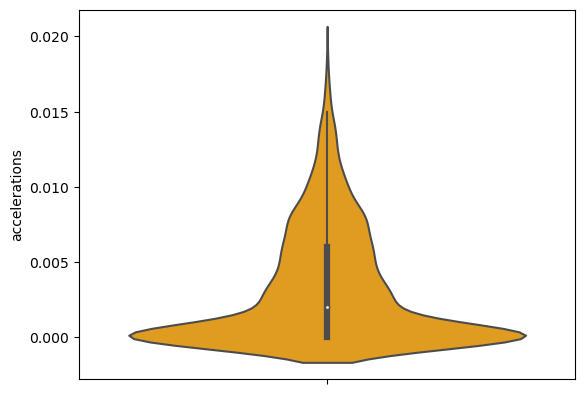

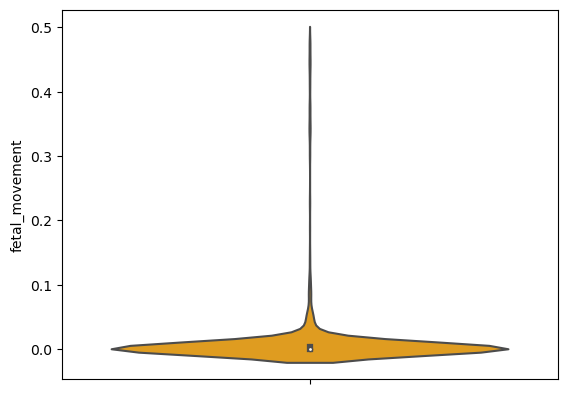

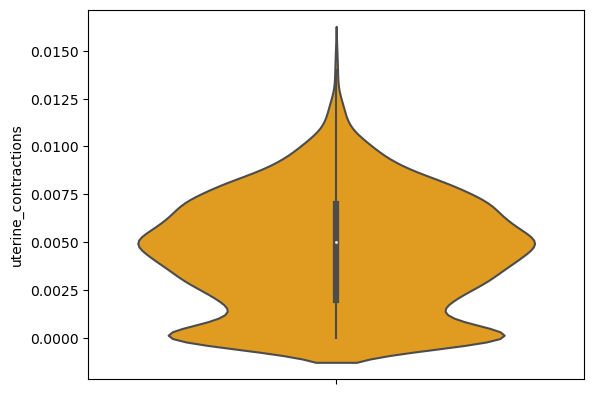

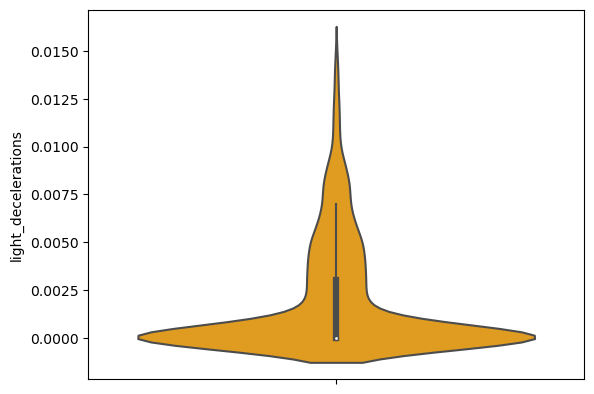

...

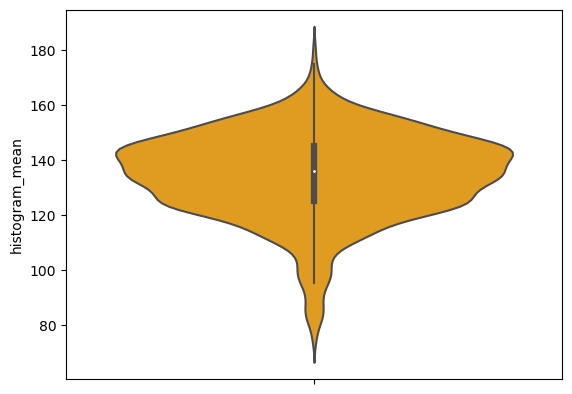

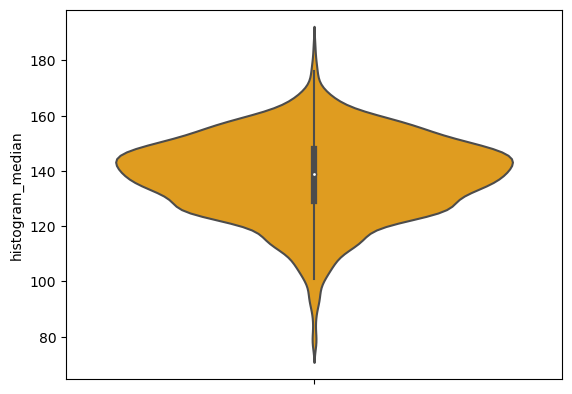

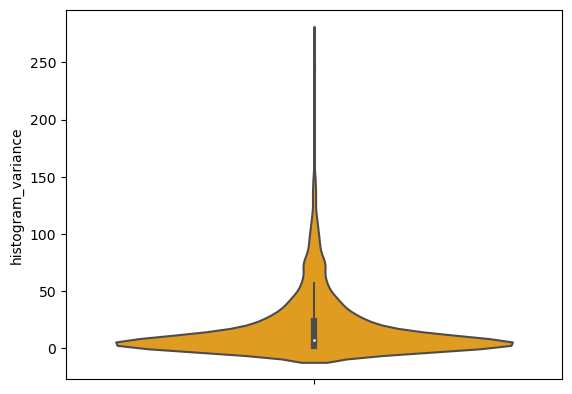

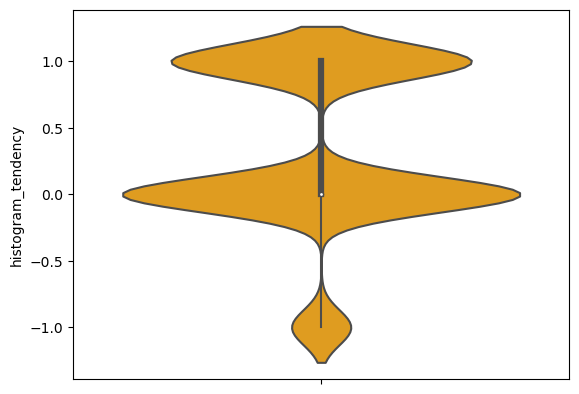

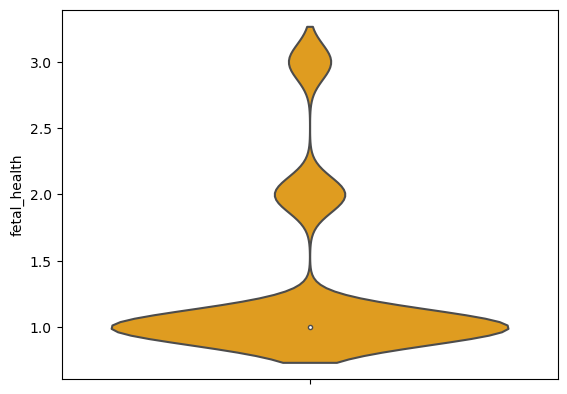

In [16]:
for i in df.columns:
    if df[i].dtypes!='object':
        sns.violinplot(y=df[i],color='orange')
        plt.show()

### Boxplot

#### A box plot (or box-and-whisker plot) shows the distribution of quantitative data in a way that facilitates comparisons between variables or across levels of a categorical variable.


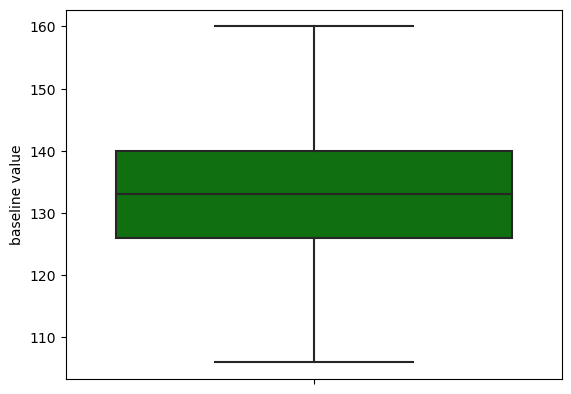

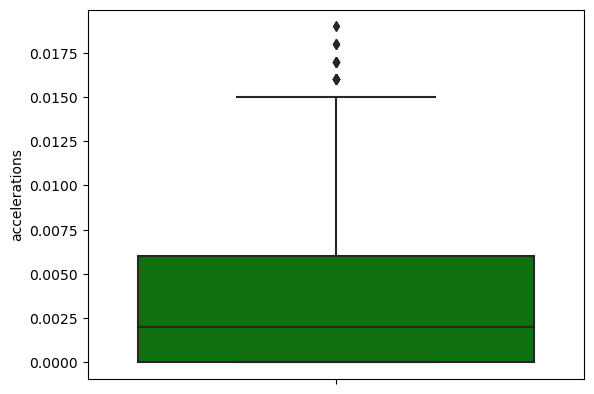

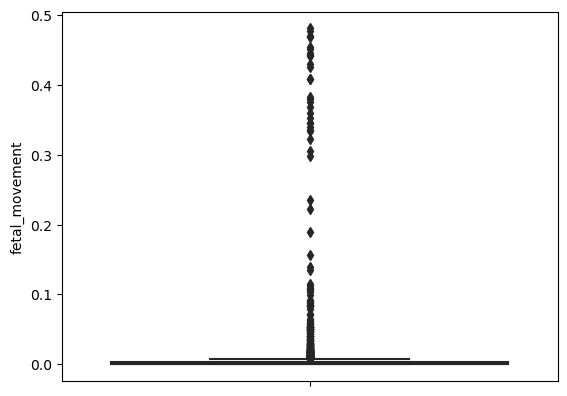

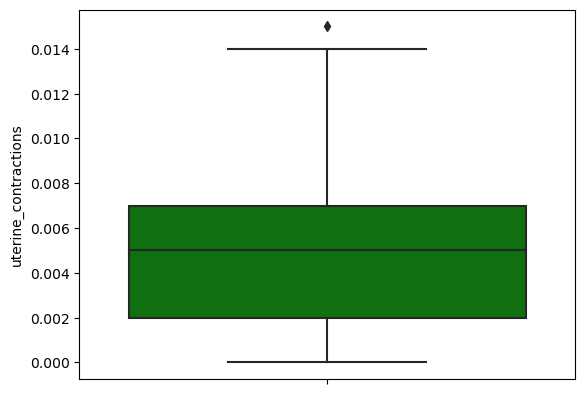

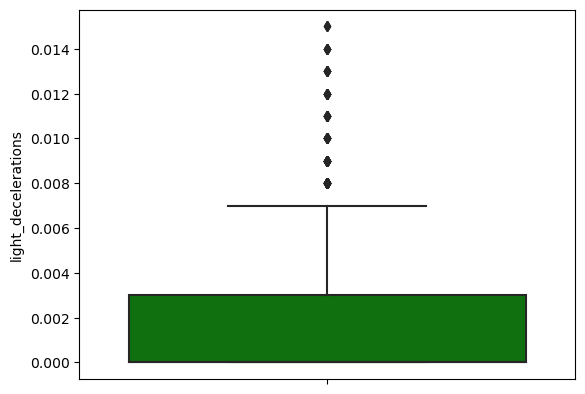

...

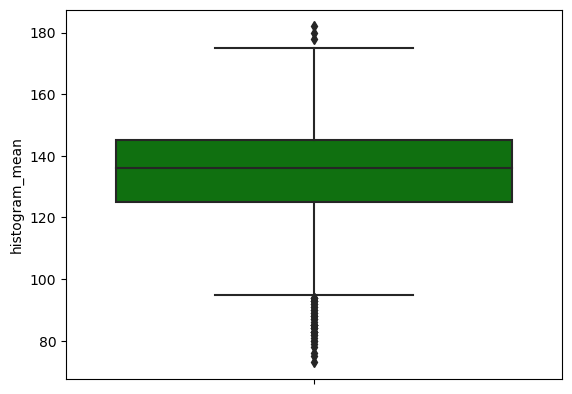

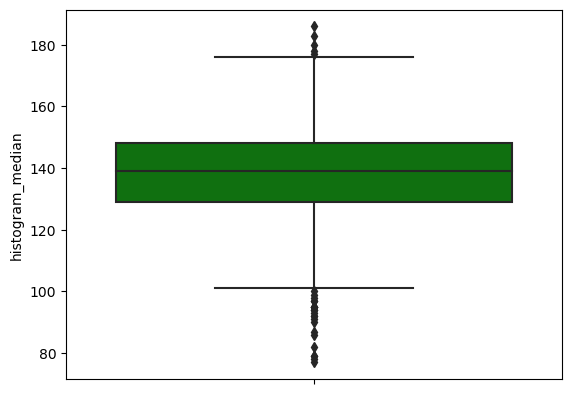

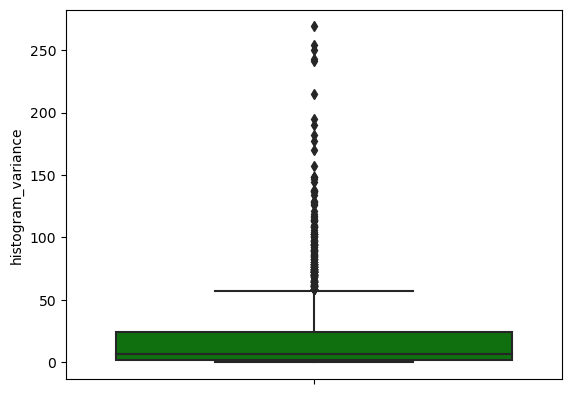

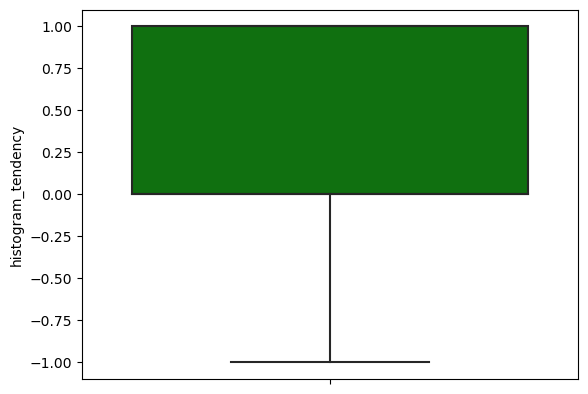

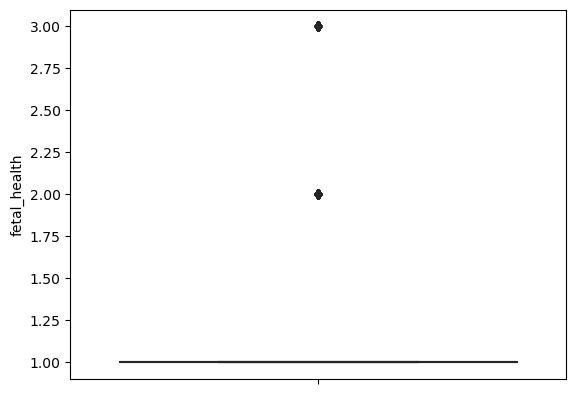

In [18]:
for i in df.columns:
    if df[i].dtypes!='object':
        sns.boxplot(y=df[i],color='green')
        plt.show()

## Multivariate Analysis

### Pairplot

#### This function will create a grid of Axes such that each numeric variable in data will by shared across the y-axes across a single row and the x-axes across a single column. The diagonal plots are treated differently: a univariate distribution plot is drawn to show the marginal distribution of the data in each column.

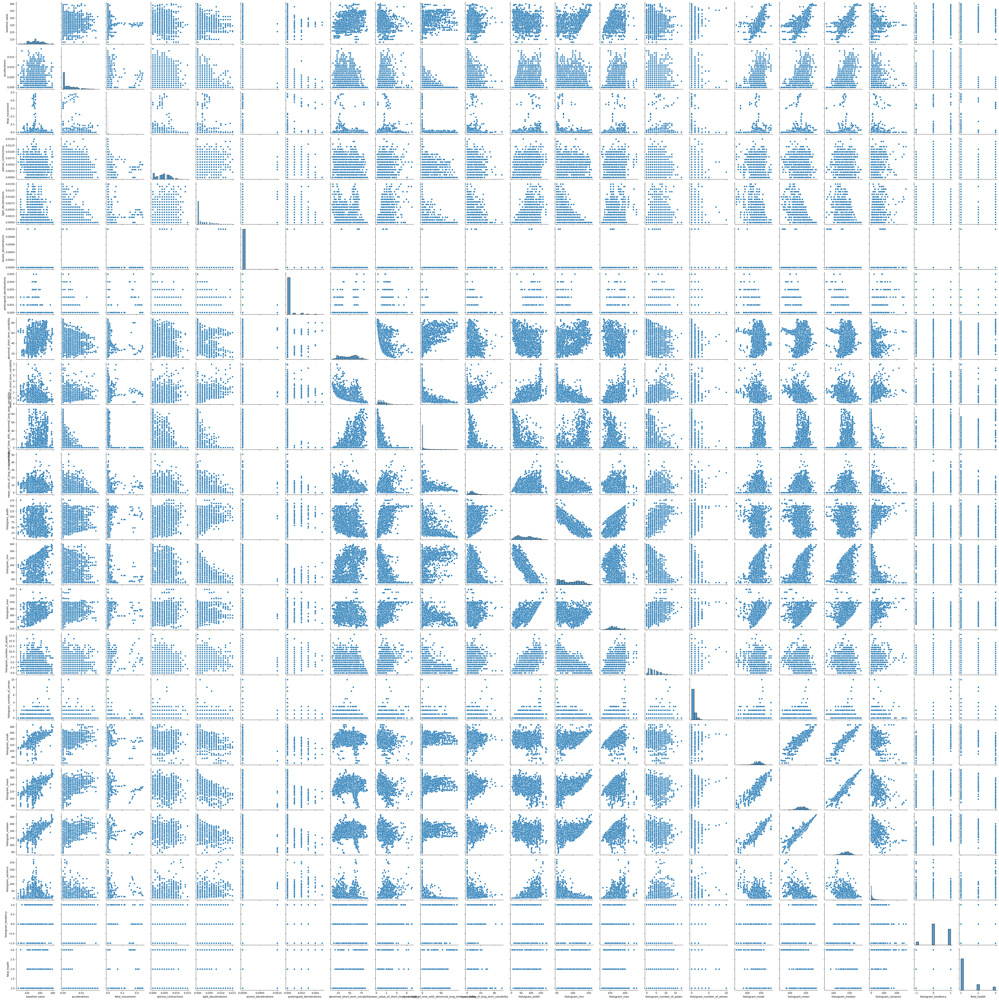

In [19]:
sns.pairplot(df)

### Barplot

#### A bar chart (aka bar graph, column chart) plots numeric values for levels of a categorical feature as bars. Levels are plotted on one chart axis, and values are plotted on the other axis. Each categorical value claims one bar, and the length of each bar corresponds to the bar’s value. Bars are plotted on a common baseline to allow for easy comparison of values.

<Figure size 4000x2000 with 0 Axes>

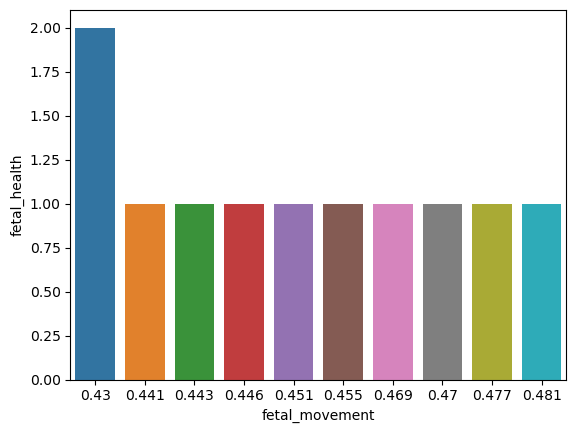

<Figure size 4000x2000 with 0 Axes>

In [20]:
sns.barplot(x='fetal_movement',y='fetal_health',data=df.sort_values(by='fetal_movement',ascending=False)[:10]);
plt.figure(figsize=(40,20))

### Lineplot

#### A line plot is a way to display data along a number line.Line plots are also called dot plots.

<Axes: xlabel='severe_decelerations', ylabel='light_decelerations'>

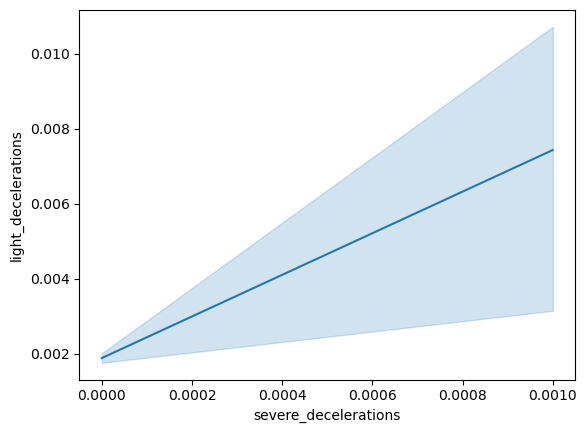

In [21]:
sns.lineplot(y='light_decelerations', x='severe_decelerations', data=df)

### Regplot

#### Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.¶

<Axes: xlabel='histogram_variance', ylabel='histogram_median'>

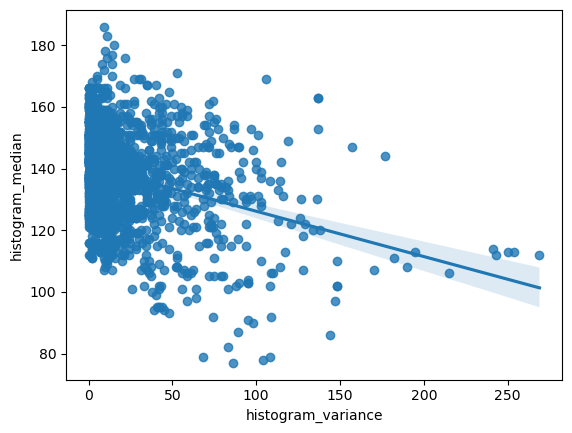

In [22]:
sns.regplot(y=df['histogram_median'], x=df['histogram_variance'])  

### Heatmap

#### A heatmap (aka heat map) depicts values for a main variable of interest across two axis variables as a grid of colored squares. The axis variables are divided into ranges like a bar chart or histogram, and each cell’s color indicates the value of the main variable in the corresponding cell range.

<Axes: >

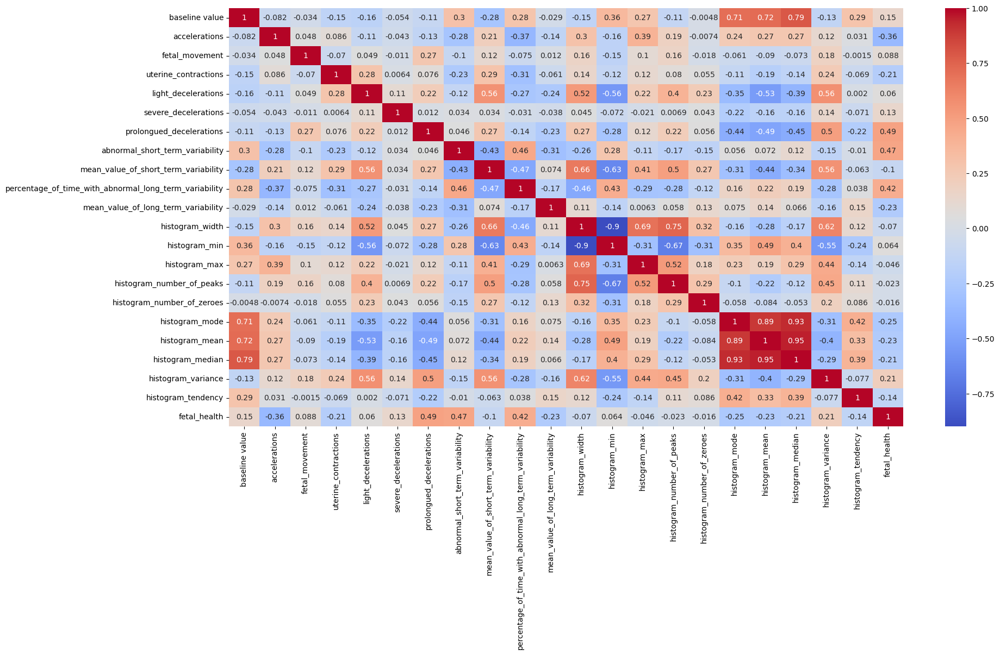

In [23]:
corr=df.corr()
plt.figure(figsize=(20,10))
sns.heatmap(corr,annot=True,cmap='coolwarm')

## Selecting X & Y

In [24]:
x = df.iloc[:,:-1].values
y = df.iloc[:,-1].values

## Imbalance Checking & Removing

#### Imbalanced-Learn is a Python module that helps in balancing the datasets which are highly skewed or biased towards some classes. Thus, it helps in resampling the classes which are otherwise oversampled or undesampled. If there is a greater imbalance ratio, the output is biased to the class which has a higher number of examples.



<Axes: ylabel='count'>

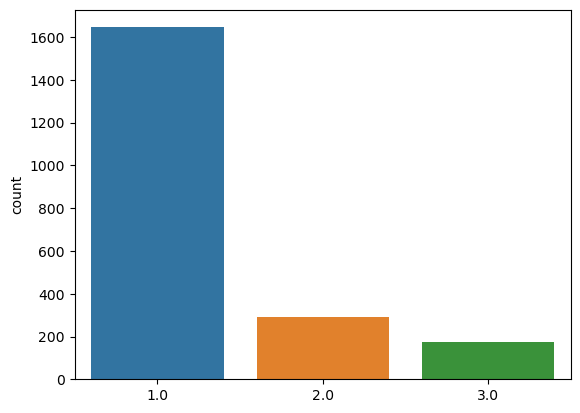

In [25]:
sns.countplot(x=y)

In [26]:
over_sampler = RandomOverSampler()

In [27]:
x, y = over_sampler.fit_resample(x,y)

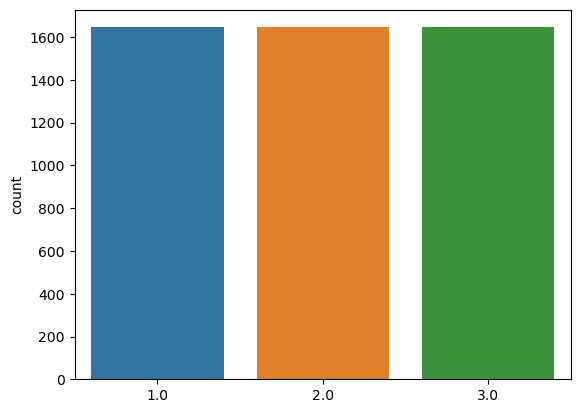

In [28]:
sns.countplot(x=y);

### The target is in balanced form. So we move to next process

## Scaling X

In [29]:
sc = StandardScaler()
x = sc.fit_transform(x)

## Selecting the Model as Randomforest Classifier

In [30]:
model = RandomForestClassifier()

In [31]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=0)

In [32]:
model.fit(x_train, y_train)
print("model trained with {}".format(model))
score_train =accuracy_score (y_train, model.predict(x_train))
score_tst = accuracy_score(y_test, model.predict(x_test))
con_train = confusion_matrix(y_train, model.predict(x_train))
con_test = confusion_matrix(y_test, model.predict(x_test))
print("Model accuracy on train is:: ",score_train)
print("Model accuracy on test is:: ", score_tst)
print("confusion_matrix train is:: ", con_train)
print("confusion_matrix test is:: ", con_test)
print("Wrong Predictions made:",(y_test !=model.predict(x_test)).sum(),'/',((y_test == model.predict(x_test)).sum()+(y_test != model.predict(x_test)).sum()))
print("*"*60)

model trained with RandomForestClassifier()
Model accuracy on train is::  0.999493670886076
Model accuracy on test is::  0.9919028340080972
confusion_matrix train is::  [[1299    2    0]
 [   0 1332    0]
 [   0    0 1317]]
confusion_matrix test is::  [[337   7   1]
 [  0 314   0]
 [  0   0 329]]
Wrong Predictions made: 8 / 988
************************************************************


In [33]:
OUTPUT= pd.DataFrame(zip(y,model.predict(x)), columns=("ACTUAL", "PREDICTION"), dtype = int)

In [34]:
OUTPUT

,ACTUAL,PREDICTION
0,2,2
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
4933,3,3
4934,3,3
4935,3,3
4936,3,3


## Confusion Matrix

#### A confusion matrix, also known as an error matrix, is a powerful tool used to evaluate the performance of classification models. The matrix is a tabular format that shows predicted values against their actual values. A confusion matrix is a table that displays the number of correct and incorrect predictions made by a classification model.


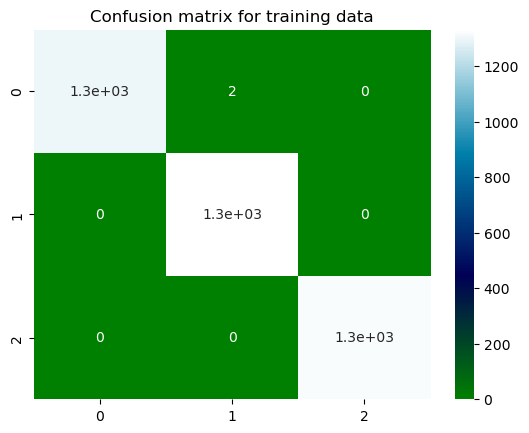

In [35]:
plt.title("Confusion matrix for training data")
sns.heatmap(con_train, annot=True, cmap='ocean');

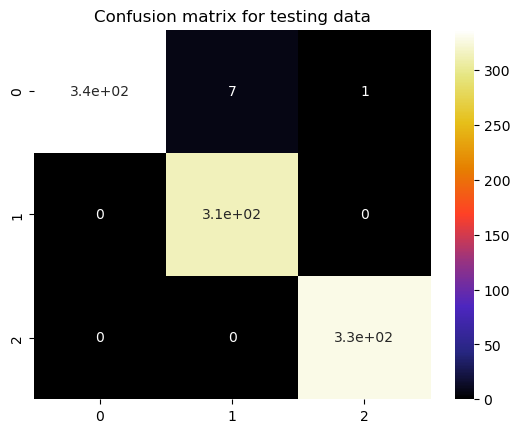

In [36]:
plt.title("Confusion matrix for testing data")
sns.heatmap(con_test, annot=True, cmap='CMRmap');

### Labelizing the Output

In [38]:
y = label_binarize(y, classes=[1.0,2.0,3.0])
n_classes = 3

In [39]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=0)

#### For plotting ROC AUC curve for each class, we need to label-binarize the Target y.

## ROC_AUC Curve

#### ROC stands for Receiver Operating Characteristic curve. This is a graph that shows the performance of a machine learning model on a classification problem by plotting the true positive rate and the false positive rate. AUC stands for Area Under the Curve. It is used to measure the entire area under the ROC curve.


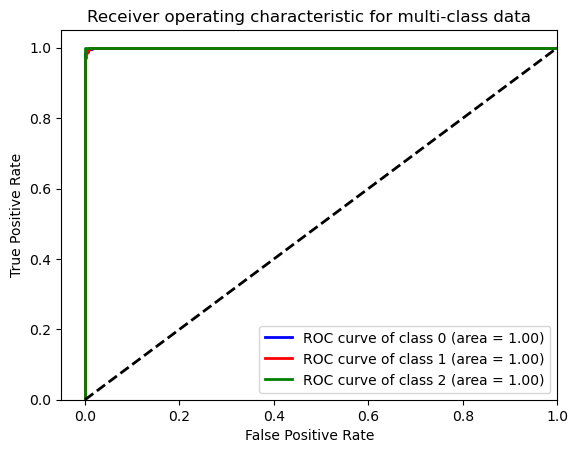

In [40]:
classifier = OneVsRestClassifier(RandomForestClassifier(random_state=0),)
y_score = classifier.fit(x_train, y_train).predict_proba(x_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'pink'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()